# Faster RCNN with Detectron2

## Install Detectron2 Dependencies

In [ ]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 703.8/703.8 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 90.3 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 1.13.1+cu116
    Uninstalling torch-1.13.1+cu116:
      Successfully uninstalled torch-1.13.1+cu116
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.1+cu116
    Uninstalling torchvision-0.14.1+cu116:
      Successfully uninstalled torchvision-0.14.1+cu116
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.14.1 requires torch==1.13.1, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.13.1+cu116 requires t

In [ ]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 KB 6.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 KB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61431 sha256=1b155bf284e86efcb1cf84dd57f6ea3f68fdaaaa0e30657d09916697a26235c9
  Stored in directory: /root/.cache/pip/wheels/b8/79/07/c0e9367f5b5ea325e246bd73651e8af175fabbef943043b1cc
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31547 sha256=d0f2c17b767b9b17a24588ef00c8690ba46c9f0f3f0ae0b5aca38a4779712208
  Stored in directory: /root/.cache/pip/wheels/89/3e/24/0f349c0b2ee

In [ ]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

## Import and Register Custom Detectron2 Data

In [ ]:
!curl -L "https://app.roboflow.com/ds/QMX4bRYjuI?key=gk1oa2UwNX" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   892  100   892    0     0   1918      0 --:--:-- --:--:-- --:--:--  1914
100 27.7M  100 27.7M    0     0  8589k      0  0:00:03  0:00:03 --:--:-- 12.9M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/IMG_1898-Small_jpeg.rf.0c06d24e0251d313e10b39802a404209.jpg  
 extracting: test/IMG_1900-Small_jpeg.rf.df2ce27991749399bab947b8ff2f3208.jpg  
 extracting: test/IMG_1910-Small_jpeg.rf.3770f093a2cd873ca4b55d3f55062ee7.jpg  
 extracting: test/IMG_1917-Small_jpeg.rf.5209129f574d4b3b007dbc181ca5db3a.jpg  
 extracting: test/IMG_1934-Small_jpeg.rf.5d404b9bd2d3b15283f0e505748f4773.jpg  
 extracting: test/IMG_1946-Small_jpeg.rf.9bd53430567065404d06c53e949d0ba3.jpg  
 extracting: test/IMG_1952-Small_jpeg.rf.bef7e11364cc929dda34676cd0245ef0.jpg  
 extra

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [03/04 18:28:08 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/04 18:28:08 d2.data.datasets.coco]: Loaded 222 images in COCO format from /content/train/_annotations.coco.json


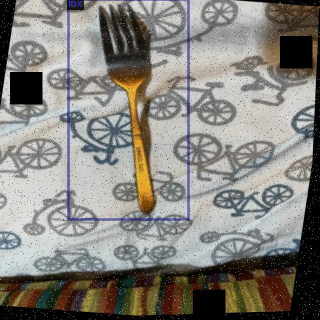

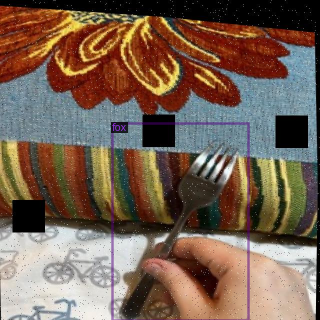

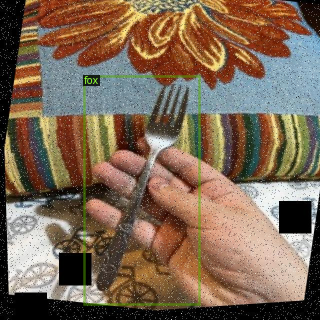

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

## Train Custom Detectron2 Detector

In [ ]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[03/04 18:28:14 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:24, 16.9MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[03/04 18:28:47 d2.engine.train_loop]: Starting training from iteration 0
[03/04 18:29:24 d2.utils.events]:  eta: 0:48:05  iter: 19  total_loss: 2.173  loss_cls: 1.342  loss_box_reg: 0.805  loss_rpn_cls: 0.011  loss_rpn_loc: 0.012  time: 1.8988  data_time: 0.0310  lr: 0.000020  max_mem: 7195M
[03/04 18:30:07 d2.utils.events]:  eta: 0:49:20  iter: 39  total_loss: 1.819  loss_cls: 0.988  loss_box_reg: 0.836  loss_rpn_cls: 0.014  loss_rpn_loc: 0.011  time: 2.0142  data_time: 0.0175  lr: 0.000040  max_mem: 7195M
[03/04 18:30:50 d2.utils.events]:  eta: 0:50:30  iter: 59  total_loss: 1.514  loss_cls: 0.649  loss_box_reg: 0.843  loss_rpn_cls: 0.013  loss_rpn_loc: 0.009  time: 2.0667  data_time: 0.0163  lr: 0.000060  max_mem: 7195M
[03/04 18:31:34 d2.utils.events]:  eta: 0:50:12  iter: 79  total_loss: 1.318  loss_cls: 0.533  loss_box_reg: 0.762  loss_rpn_cls: 0.008  loss_rpn_loc: 0.010  time: 2.0984  data_time: 0.0169  lr: 0.000080  max_mem: 7195M
[03/04 18:32:18 d2.utils.events]:  eta: 0:49:4

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
result = inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [03/04 19:29:29 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/04 19:29:29 d2.data.datasets.coco]: Loaded 12 images in COCO format from /content/test/_annotations.coco.json
[03/04 19:29:29 d2.data.common]: Serializing 12 elements to byte tensors and concatenating them all ...
[03/04 19:29:29 d2.data.common]: Serialized dataset takes 0.00 MiB
[03/04 19:29:29 d2.evaluation.evaluator]: Start inference on 12 images
[03/04 19:29:32 d2.evaluation.evaluator]: Inference done 11/12. 0.1833 s / img. ETA=0:00:00
[03/04 19:29:32 d2.evaluation.evaluator]: Total inference time: 0:00:01.412311 (0.201759 s / img per device, on 1 devices)
[03/04 19:29:32 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.182222 s / img per device, on 1 devices)
[03/04 19:29:32 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[03/04 19:29:32 d2.evaluation.coco_evaluation]: Saving results to ./output/c

In [37]:
print("Mean Average Precision = ~72%")

Mean Average Precision = ~72%


## Inference with Detectron2 Saved Weights



In [ ]:
%ls ./output/

coco_instances_results.json                        last_checkpoint
events.out.tfevents.1677954501.b035defa6a72.150.0  metrics.json
instances_predictions.pth                          model_final.pth


In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

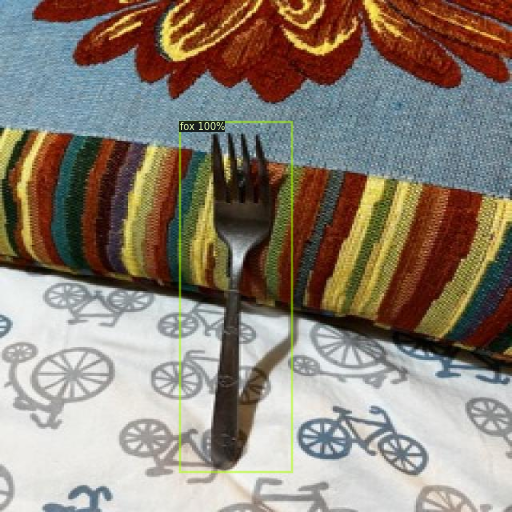

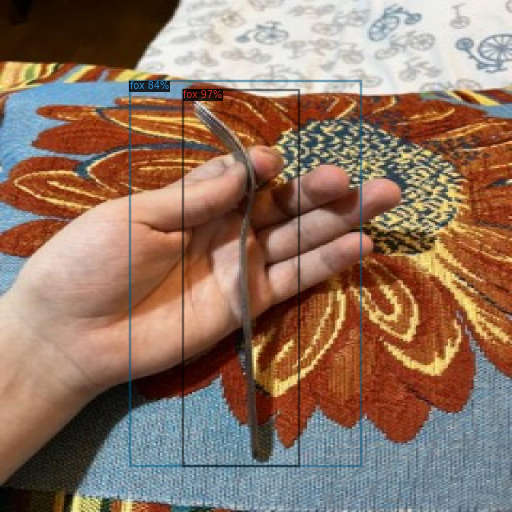

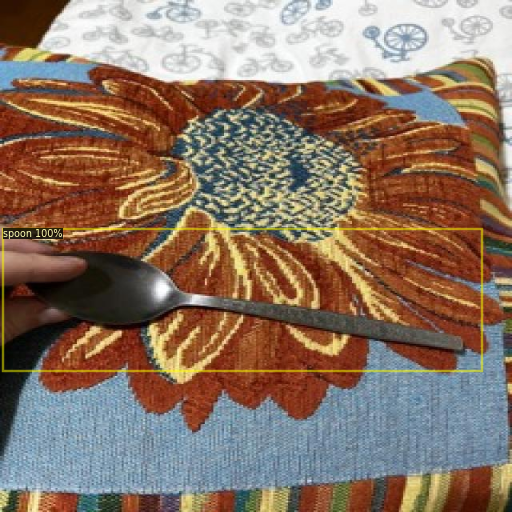

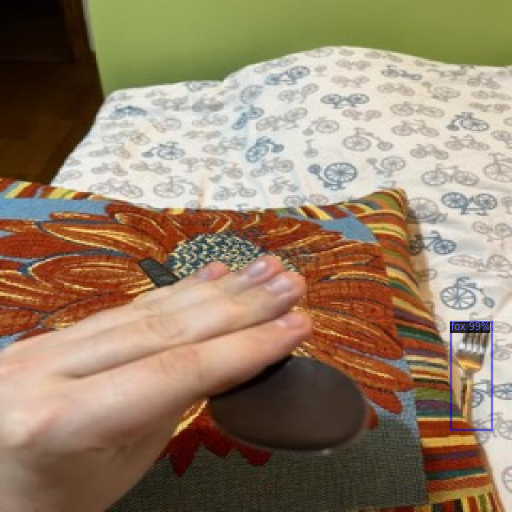

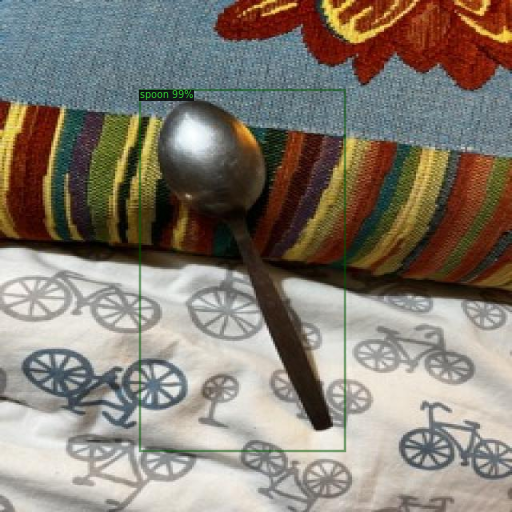

...

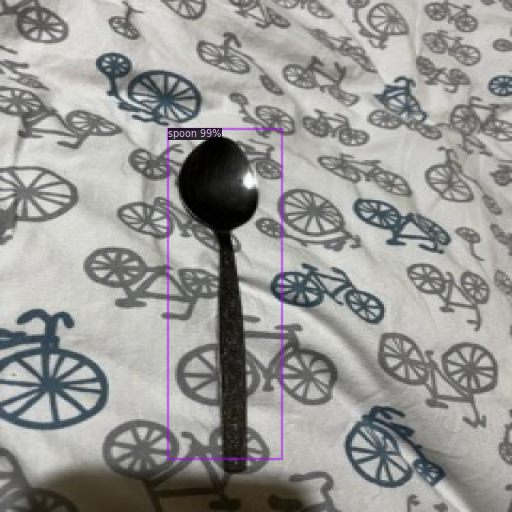

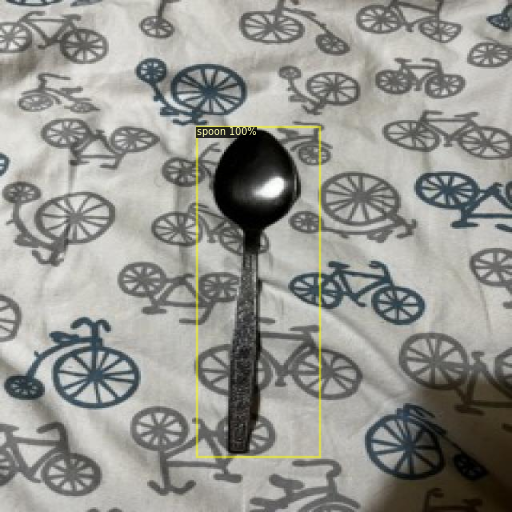

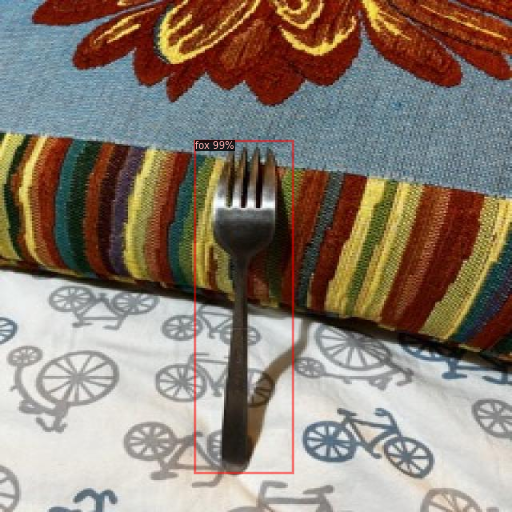

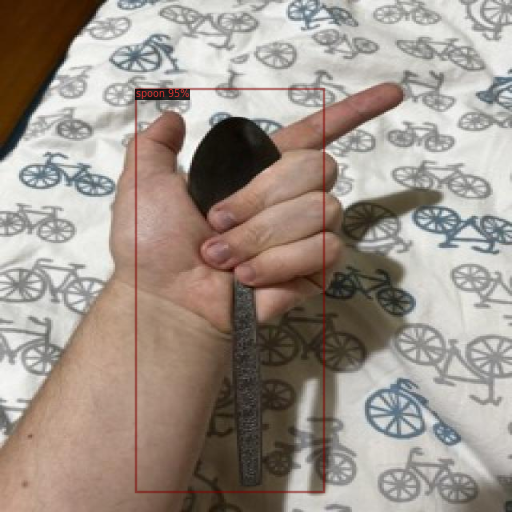

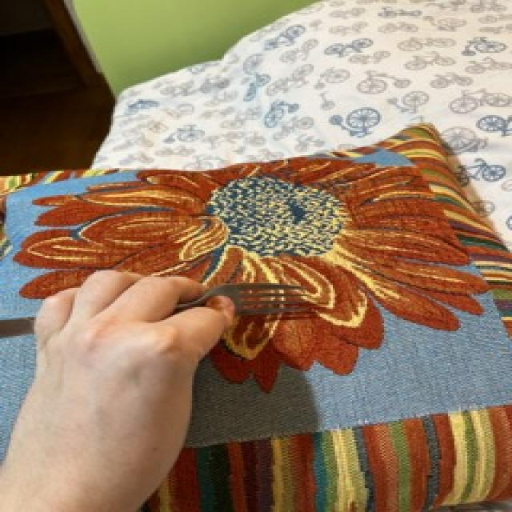

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])


# YoloV8

## Install YOLOv8

In [ ]:
# Pip install method (recommended)
!pip install -U torch==1.7 -f https://download.pytorch.org/whl/cu101/torch_stable.html 

!pip install ultralytics==8.0.20


Restart runtime here

In [ ]:
%cd /content
import os
HOME = os.getcwd()
print(HOME)

/content
/content


In [ ]:
from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu117 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.9/78.2 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

In [ ]:
%%capture
!pip install roboflow

In [ ]:
!mkdir datasets
%cd /content/datasets
!curl -L "https://app.roboflow.com/ds/miRgG4lccG?key=yCkWnbHP15" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
%cd ..


/content/datasets
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   894  100   894    0     0   1773      0 --:--:-- --:--:-- --:--:--  1773
100 27.7M  100 27.7M    0     0  7652k      0  0:00:03  0:00:03 --:--:-- 12.5M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/IMG_1898-Small_jpeg.rf.0c06d24e0251d313e10b39802a404209.jpg  
 extracting: test/images/IMG_1900-Small_jpeg.rf.df2ce27991749399bab947b8ff2f3208.jpg  
 extracting: test/images/IMG_1910-Small_jpeg.rf.3770f093a2cd873ca4b55d3f55062ee7.jpg  
 extracting: test/images/IMG_1917-Small_jpeg.rf.5209129f574d4b3b007dbc181ca5db3a.jpg  
 extracting: test/images/IMG_1934-Small_jpeg.rf.5d404b9bd2d3b15283f0e505748f4773.jpg  
 extracting: test/images/IMG_1946-Small_jpeg.rf.9

In [25]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data=/content/datasets/data.yaml epochs=24 plots=True

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu117 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/content/datasets/data.yaml, epochs=24, patience=50, batch=16, imgsz=640, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, simplify

/content


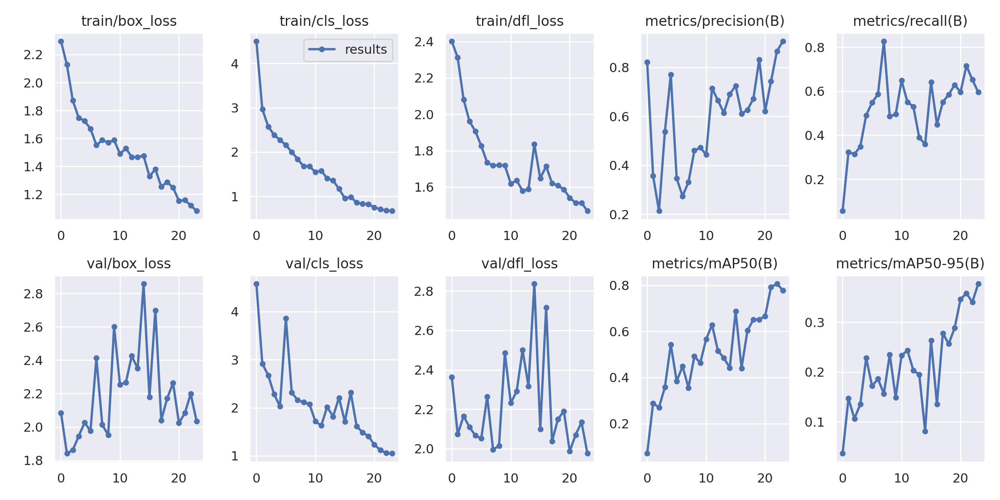

In [26]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

## Evaluation

In [30]:
%cd {HOME}

!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data=/content/datasets/data.yaml

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu117 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/valid/labels.cache... 20 images, 0 backgrounds, 0 corrupt: 100% 20/20 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 2/2 [00:00<00:00,  2.02it/s]
                   all         20         20      0.907      0.596      0.778      0.377
                   fox         20         11      0.841      0.636      0.713      0.333
                 spoon         20          9      0.973      0.556      0.843      0.422
Speed: 0.3ms pre-process, 15.0ms inference, 0.0ms loss, 1.1ms post-process per image


In [38]:
print("Mean Average Precision (mAP) = 84.3%")

Mean Average Precision (mAP) = 84.3%


# Comparison

- Mean Average Precision
  - Faster RCNN: 72%
  - Yolov8: 84.3%
- Speed:
  - Yolo is a lot faster and such speed gives a lot of betefits despite its size
  - Yolo training for 24 epochs done in 4 minutes, but Faster RCNN in 55 minutes
- Size:
  - Fater RCNN model size: 796.5 Mb
  - Yolov8 model size: 21.46 Mb